In [47]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

In [45]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [48]:
from keras.utils import image_dataset_from_directory

AUTOTUNE = tf.data.AUTOTUNE
trainA = image_dataset_from_directory('/kaggle/input/cyclegan/cezanne2photo/cezanne2photo/trainA/', label_mode=None).unbatch()
testA = image_dataset_from_directory('/kaggle/input/cyclegan/cezanne2photo/cezanne2photo/testA/', label_mode=None).unbatch()
trainB = image_dataset_from_directory('/kaggle/input/cyclegan/cezanne2photo/cezanne2photo/trainB/', label_mode=None).unbatch()
testB = image_dataset_from_directory('/kaggle/input/cyclegan/cezanne2photo/cezanne2photo/testB/', label_mode=None).unbatch()

Found 525 files belonging to 1 classes.
Found 58 files belonging to 1 classes.
Found 6287 files belonging to 1 classes.
Found 751 files belonging to 1 classes.


In [49]:
import tensorflow as tf
def normalize_image(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image


def preprocess_train(image):
    image = tf.image.resize(image, [286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    image = tf.image.random_crop(value=image, size=(256, 256, 3))
    image = tf.image.random_flip_left_right(image)
    image = normalize_image(image)
    return image

In [50]:
trainA = trainA.cache().map(
    preprocess_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

trainB = trainB.cache().map(
    preprocess_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

testA = testA.cache().map(
    normalize_image, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

testB = testB.cache().map(
    normalize_image, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

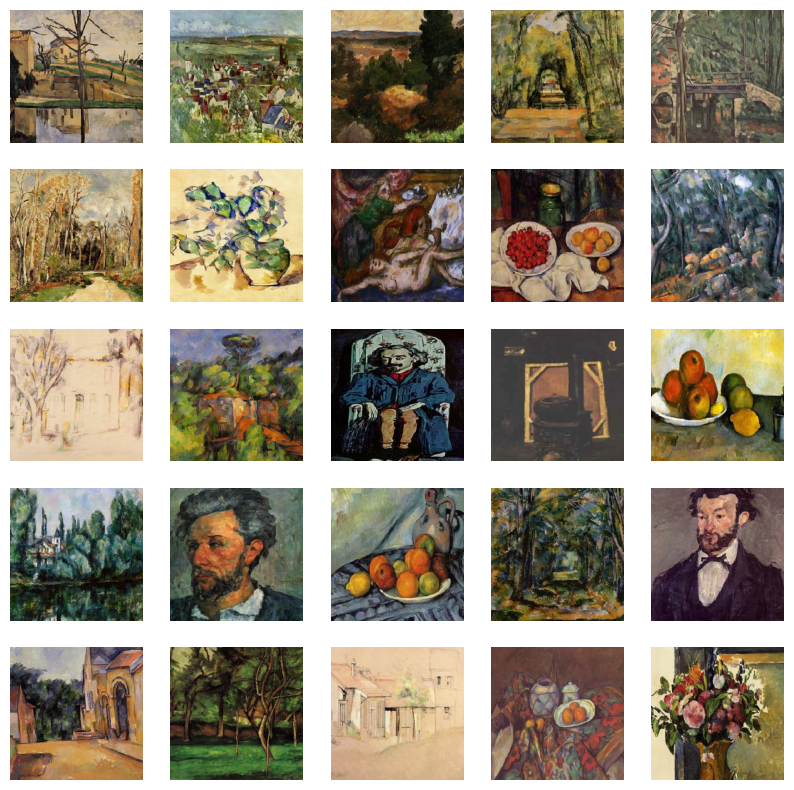

In [53]:
plt.figure(figsize=(10, 10))
for i in range(25):
    imageA = next(iter(trainA))
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(imageA[0] * 0.5 + 0.5)
    plt.axis("off")

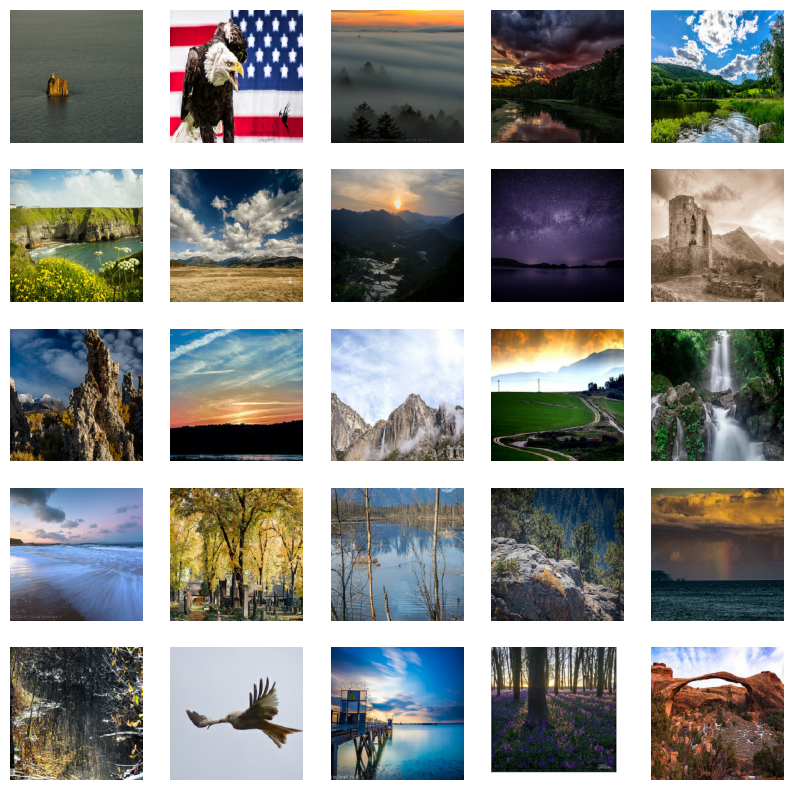

In [54]:
plt.figure(figsize=(10, 10))
for i in range(25):
    imageB = next(iter(trainB))
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(imageB[0] * 0.5 + 0.5)
    plt.axis("off")

In [55]:
kernel_size = 2
filters = [64, 128, 256, 512, 1028]
image_shape = (IMG_WIDTH, IMG_HEIGHT, 3)

In [56]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-1yl5vqh4
  Running command git clone --filter=blob:none --quiet https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-1yl5vqh4
  Resolved https://www.github.com/keras-team/keras-contrib.git to commit 3fc5ef709e061416f4bc8a92ca3750c824b5d2b0
  Preparing metadata (setup.py) ... done
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-py3-none-any.whl size=101058 sha256=b348de3b4117d25cc1b7805df21b4f072f72b14ed71ebbaf6728f886e8d7627e
  Stored in directory: /tmp/pip-ephem-wheel-cache-n2v02_s_/wheels/74/d5/f7/0245af7ac33d5b0c2e095688649916e4bf9a8d6b3362a849f5
Successfully built keras-contrib


In [57]:
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from keras.layers import Conv2D, LeakyReLU, Conv2DTranspose, Dropout, Concatenate, Input

In [58]:
def dblock(input_layer, filters, kernel):
    dl = Conv2D(filters=filters, kernel_size=kernel, strides=2, padding='same')(input_layer)
    dl = LeakyReLU(alpha=0.2)(dl)
    dl = InstanceNormalization(axis=-1)(dl)
    return dl

In [59]:
def ublock(input_layer, skip_layer, filters, kernel, dropout=0.0):
    ul = Conv2DTranspose(filters, kernel_size=kernel, strides=2, padding='same', activation='relu')(input_layer)
    if dropout > 0:
        ul = Dropout(dropout)(ul)
    ul = InstanceNormalization(axis=-1)(ul)
    ul = Concatenate()([ul, skip_layer])
    return ul

In [60]:
from keras import Model
def generator(image_shape, filters, kernel_size):
    input_layer = Input(shape=image_shape)
    d = input_layer
    residuals = []
    for f in filters:
        d = dblock(d, f, kernel_size)
        residuals.append(d)
    
    u = d
    for idx, f in enumerate(filters[-2::-1]):
        u = ublock(u, residuals[len(filters) - idx - 2], f, kernel_size)

    u = Conv2DTranspose(3, kernel_size=kernel_size*2, strides=2, padding='same', activation='tanh')(u)
    
    return Model(input_layer, u)

In [61]:
def discriminator_block(input_layer, filters, kernel_size):
    dl = Conv2D(filters, kernel_size=kernel_size, strides=2, padding='same')(input_layer)
    dl = LeakyReLU(alpha=0.2)(dl)
    dl = InstanceNormalization(axis=-1)(dl)
    return dl

In [62]:
def discriminator(image_shape, filters, kernel_size):
    input_layer = Input(shape=image_shape)
    
    disc1 = discriminator_block(input_layer, filters[0], kernel_size)
    disc2 = discriminator_block(disc1, filters[1], kernel_size)
    disc3 = discriminator_block(disc2, filters[2], kernel_size)
    disc4 = discriminator_block(disc3, filters[3], kernel_size)
    output = Conv2D(1, kernel_size=kernel_size, strides=1, padding='same', activation='sigmoid')(disc4)
    
    return Model(input_layer, output)

In [63]:
disc_A = discriminator(image_shape, filters, 4)
disc_B = discriminator(image_shape, filters, 4)

gen_AB = generator(image_shape, filters, 2)
gen_BA = generator(image_shape, filters, 2)

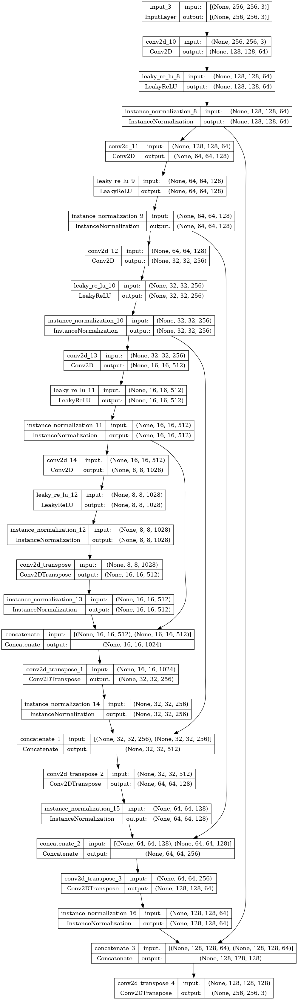

In [64]:
from keras.utils import plot_model
plot_model(gen_AB, show_shapes=True)

In [65]:
from keras.models import load_model
cust = {'InstanceNormalization': InstanceNormalization}

#disc_A = load_model('/kaggle/output/disc_A.h5', cust)
#disc_B = load_model('/kaggle/output/disc_B.h5', cust)
#gen_AB = load_model('/kaggle/output/gen_AB.h5', cust)
#gen_BA = load_model('/kaggle/output/gen_BA.h5', cust)

In [68]:
def discriminator_loss(real, generated):
    real_loss = loss_objective(tf.ones_like(real), real)
    generated_loss = loss_objective(tf.zeros_like(generated), generated)
    return (real_loss + generated_loss) * 0.5


def generator_loss(generated):
    return loss_objective(tf.ones_like(generated), generated)


def cycle_loss(real, cycled):
    return tf.reduce_mean(tf.abs(real - cycled)) * LAMBDA


def identity_loss(real, same):
    return tf.reduce_mean(tf.abs(real - same)) * LAMBDA * 0.5

In [69]:
from keras.optimizers import Adam
from keras.losses import BinaryCrossentropy
LAMBDA = 10
loss_objective = BinaryCrossentropy(from_logits=True)
gen_AB_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
gen_BA_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_A_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_B_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [70]:
checkpoint = tf.train.Checkpoint(gen_AB=gen_AB,
                                   gen_BA=gen_BA,
                                   disc_A=disc_A,
                                   disc_B=disc_B,
                                   gen_AB_optimizer=gen_AB_optimizer,
                                   gen_BA_optimizer=gen_BA_optimizer,
                                   disc_A_optimizer=disc_A_optimizer,
                                   disc_B_optimizer=disc_B_optimizer)
checkpoint_manager = tf.train.CheckpointManager(checkpoint, '/kaggle/working/checkpoints', max_to_keep=5)
if checkpoint_manager.latest_checkpoint:
    checkpoint.restore(checkpoint_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [81]:
def generate_images(model, test_input):
    prediction = model(test_input)
    plt.figure(figsize=(10, 10))
    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Predicted Image']
    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [76]:
EPOCHS = 200

@tf.function
def train_step(real_A, real_B):
    with tf.GradientTape(persistent=True) as tape:
        fake_B = gen_AB(real_A, training=True)
        cycled_A = gen_BA(fake_B, training=True)
    
        fake_A = gen_BA(real_B, training=True)
        cycled_B = gen_AB(fake_A, training=True)
    
        same_A = gen_BA(real_A, training=True)
        same_B = gen_AB(real_B, training=True)
    
        disc_real_A = disc_A(real_A, training=True)
        disc_real_B = disc_B(real_B, training=True)
        disc_fake_A = disc_A(fake_A, training=True)
        disc_fake_B = disc_B(fake_B, training=True)
        
        gen_AB_loss = generator_loss(disc_fake_B)
        gen_BA_loss = generator_loss(disc_fake_A)
        
        total_cycle_loss = cycle_loss(real_A, cycled_A) + cycle_loss(real_B, cycled_B)
        
        total_gen_AB_loss = gen_AB_loss + total_cycle_loss + identity_loss(real_A, same_A)
        total_gen_BA_loss = gen_BA_loss + total_cycle_loss + identity_loss(real_B, same_B)
        
        disc_A_loss = discriminator_loss(disc_real_A, disc_fake_A)
        disc_B_loss = discriminator_loss(disc_real_B, disc_fake_B)
    
    gen_AB_gradients = tape.gradient(total_gen_AB_loss, gen_AB.trainable_variables)
    gen_BA_gradients = tape.gradient(total_gen_BA_loss, gen_BA.trainable_variables)
    disc_A_gradients = tape.gradient(disc_A_loss, disc_A.trainable_variables)
    disc_B_gradients = tape.gradient(disc_B_loss, disc_B.trainable_variables)
    
    gen_AB_optimizer.apply_gradients(zip(gen_AB_gradients, gen_AB.trainable_variables))
    gen_BA_optimizer.apply_gradients(zip(gen_BA_gradients, gen_BA.trainable_variables))
    disc_A_optimizer.apply_gradients(zip(disc_A_gradients, disc_A.trainable_variables))
    disc_B_optimizer.apply_gradients(zip(disc_B_gradients, disc_B.trainable_variables))
    

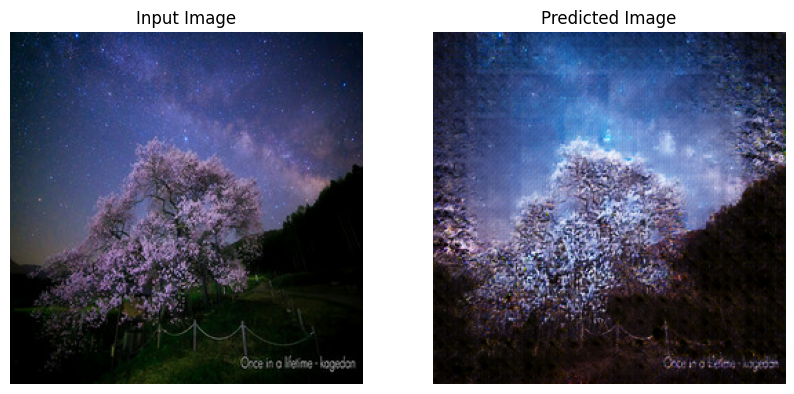

Saved checkpoint for epoch 100 at /kaggle/working/checkpoints/ckpt-40


In [87]:
from IPython.display import clear_output
sampleB = next(iter(testB))
for epoch in range(EPOCHS):
    n = 0
    for imageA, imageB in tf.data.Dataset.zip((trainA, trainB)):
        train_step(imageA, imageB)
        if n % 10 == 0:
            print('.', end='')
        n += 1
    clear_output(wait=True)
    generate_images(gen_AB, sampleB)
    if (epoch + 1) % 5 == 0:
        checkpoint_save_path = checkpoint_manager.save()
        print(f"Saved checkpoint for epoch {epoch+1} at {checkpoint_save_path}")

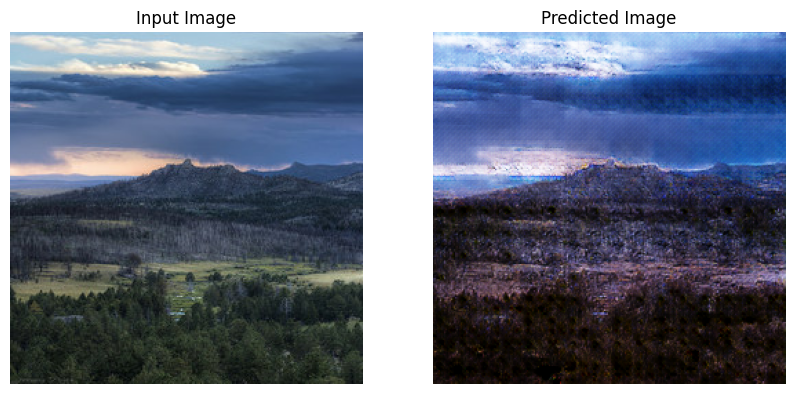

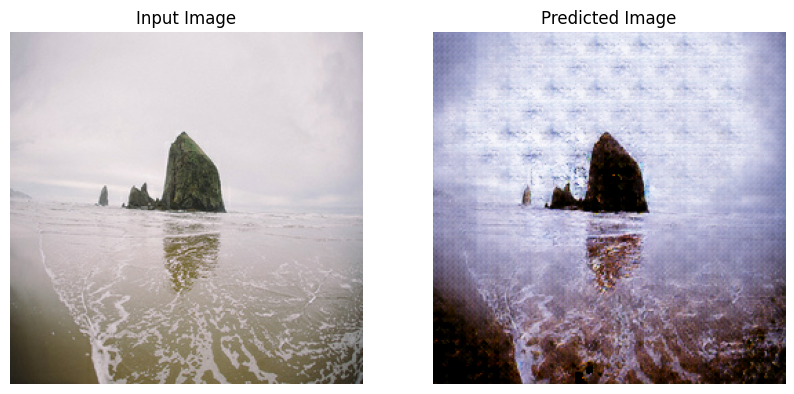

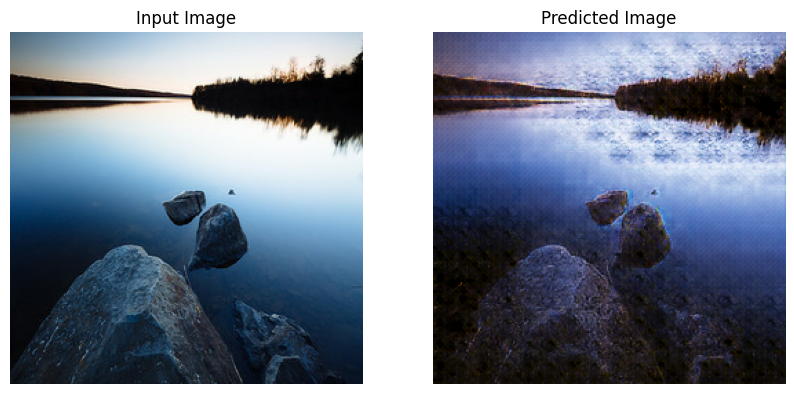

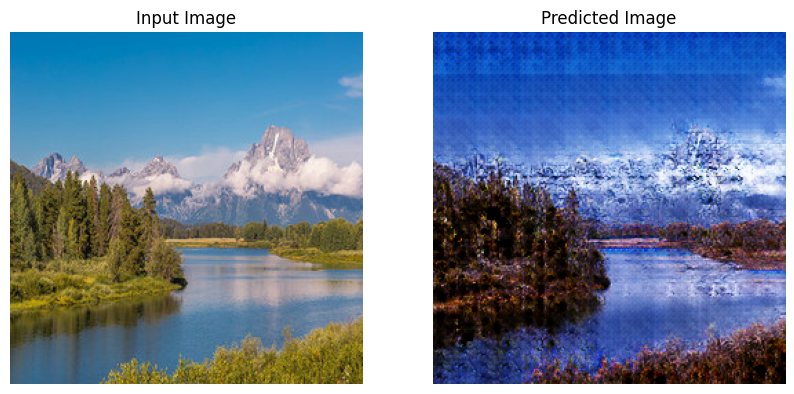

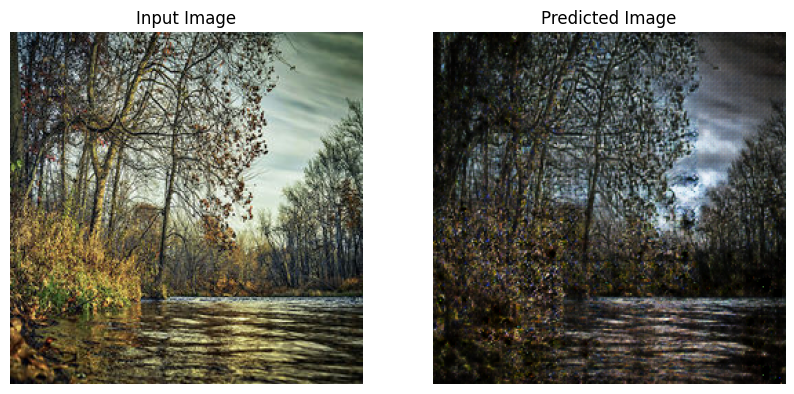

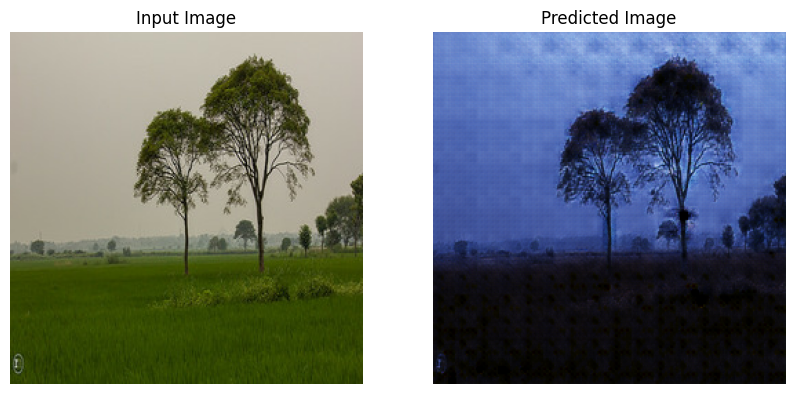

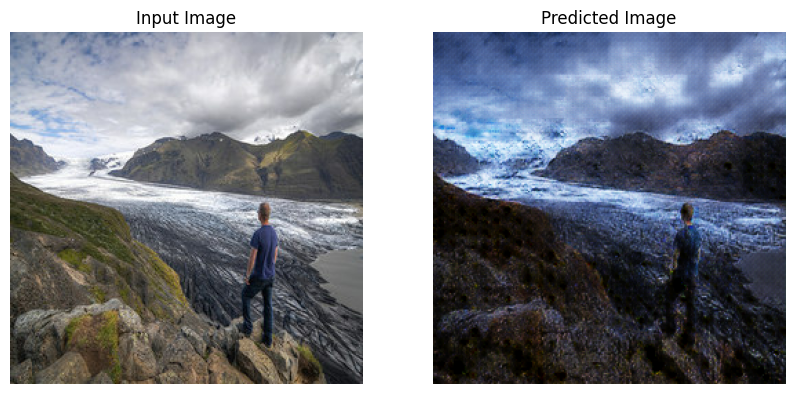

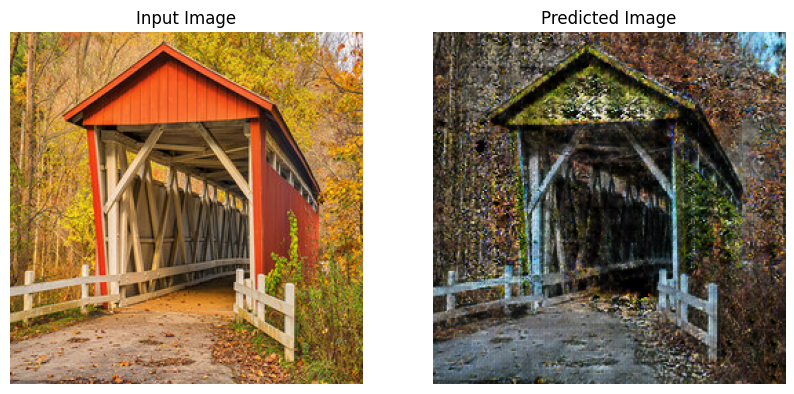

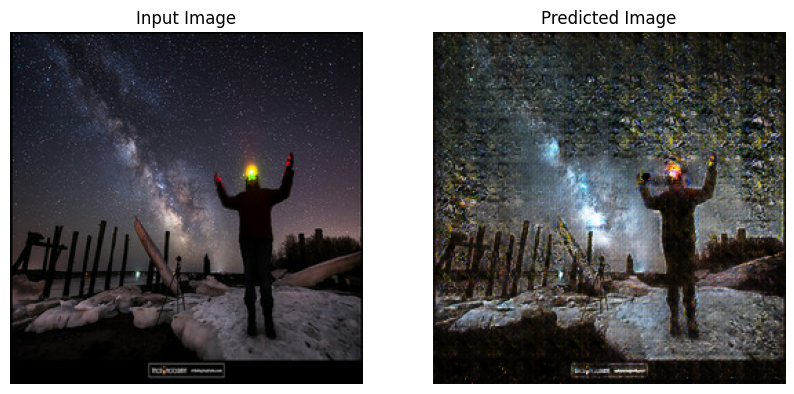

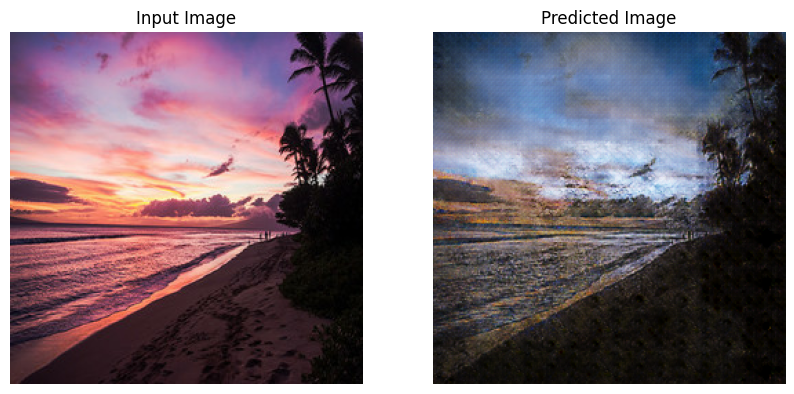

In [88]:
for i in range(10):
    sampleB = next(iter(testB))
    generate_images(gen_AB, sampleB)

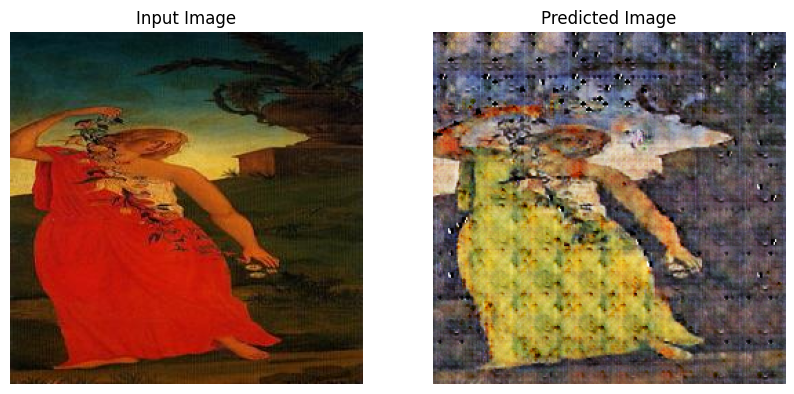

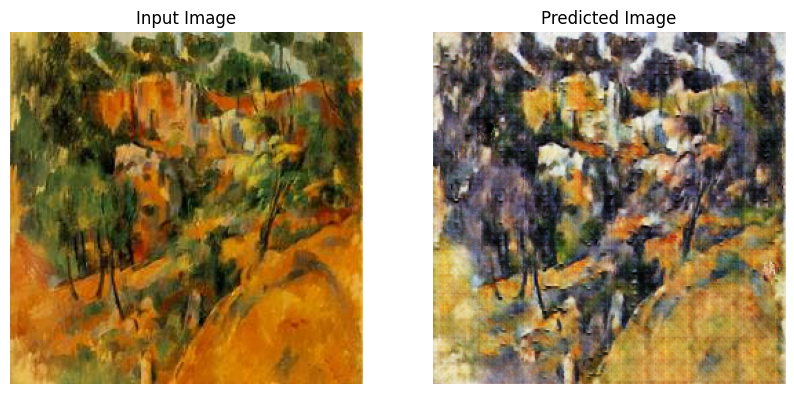

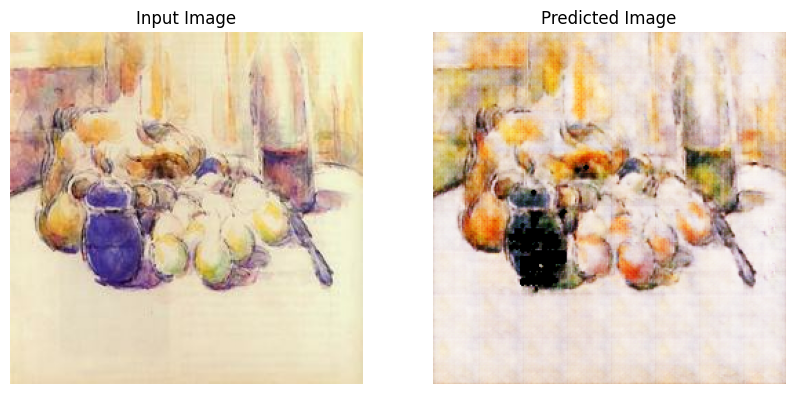

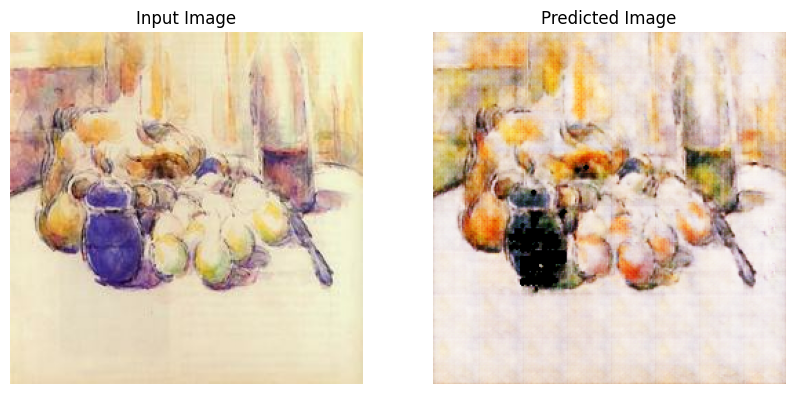

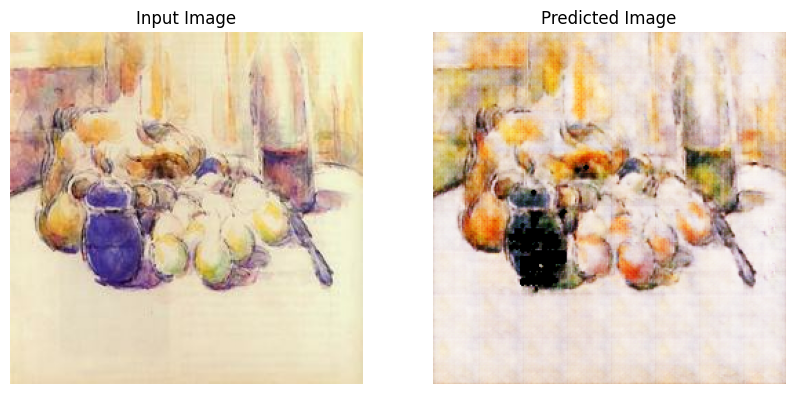

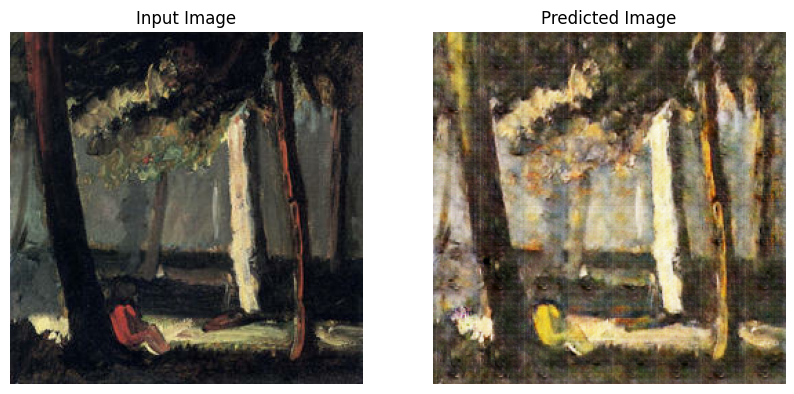

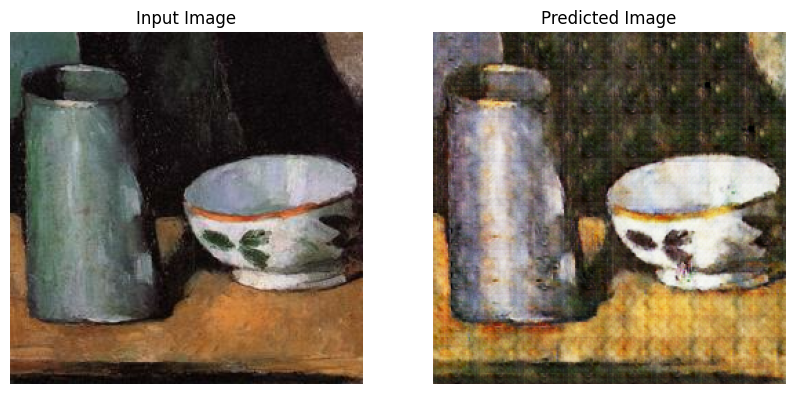

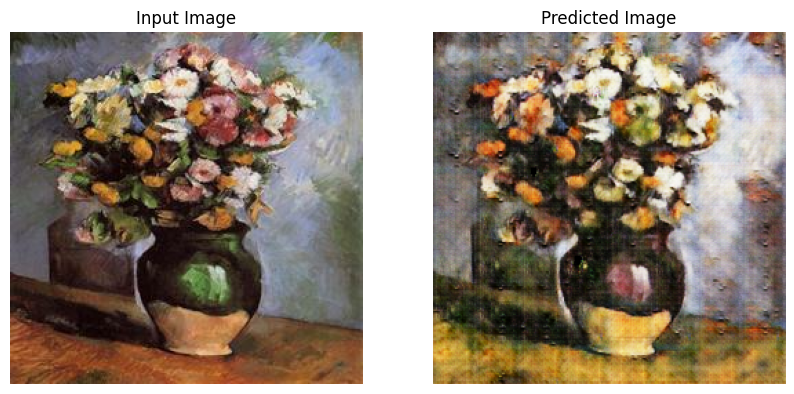

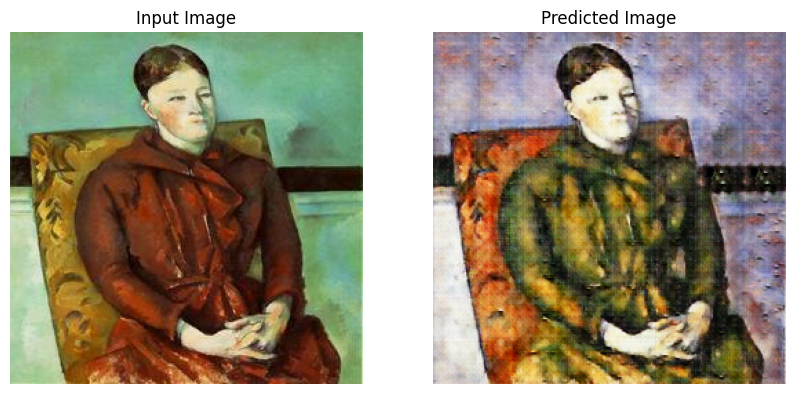

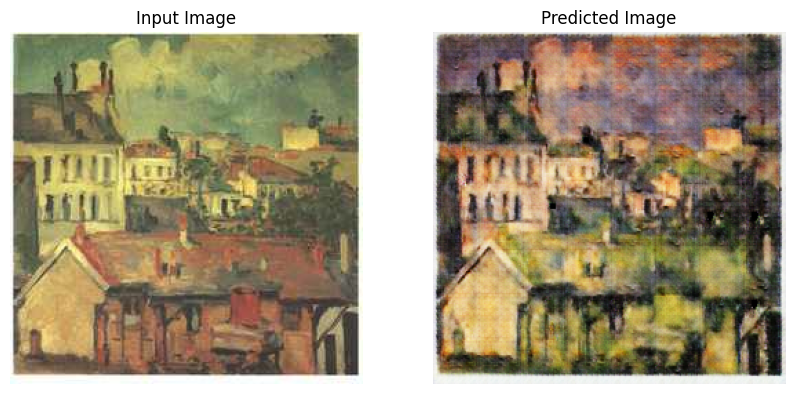

In [89]:
for i in range(10):
    sampleA = next(iter(testA))
    generate_images(gen_BA, sampleA)